# Attacks on AWS Honeypots - 2013 Data

f-fazo



---

**Illegal cyber activity is going bonkers!**

As the prowess of network security becomes more demanding with the innovation of technology, the demand for lawful activity on the internet must continue to increase. Despite a seemingly hopeful statement such as the latter, malicious actors across the world continue their illegal due diligence and spread chaos across the internet through exploitation, social engineering, spreading malware, etc. At a global scale, these hackers may not be united by goal or driven by the same ideologies, but they do share tendencies; tendencies this tutorial aims to explore.

**How are we going to explore these tendencies?**

We'll be exploring these tendencies by analyzing attacks made on AWS honeypots between 9:53pm on March 3 2013 to 5:55am on 8 September 2013. The dataset we will be exploring in this analysis contains variables that I will be defining here, to ease the in the understanding of what they mean later on:


*   Datetime: When the (malicious) packet arrived at the host
*   Host: The AWS Honeypot server
*   src: Packet source
*   proto: Packet Protocol Type: ICMP/ TCP/ UDP
*   spt: Source port
*   dpt: Destination port
*   srcstr: Source IP address
*   cc: Source Country code
*   country: Source country
*   locale: Source location
*   localeabbr: Locale Abbreviation
*   Postalcode: postal code of the source
*   Latitude: Source latitude
*   Longitude: Source longitude

**All this talk of honeypots, what are they?**

In simplest terms, honeypots are a trap for network attacks, and records the metadata from those attacks (information listed above) for analytical purposes. [AWS](https://wiki.smu.edu.sg/1718t3isss608/Group01_Dataset_Overview) describes honeypots as "a security mechanism intended to lure and deflect an attempted attack. AWS’s honeypot is a trap point that one can insert into a website to detect inbound requests from content scrapers and bad bots."


**Main objective**

The main objective of this tutorial is to take you along the journey of analyzing a real-world dataset through the use of Python and its libraries and packages, and by trying to figure out if given the dataset used below, a malicious act against a honeypot can be predicted.

**Final Notes**

Hereinafter, "columns" and "attributes" will be interchangeable. Anything related to the "dataset" will refer to the most updated version of the "data" variable, which will be used for most current analysis.


# What does this tutorial's code run on?
This tutorial will utilize Python 3 and its packages and libraries. If you are interested in learning more about the following packages, each has been hotlinked to its documentation page for your convenience.

1.   [Python 3](https://docs.python.org/3/)
2.   [Pandas](https://pandas.pydata.org/docs/)
3.   [Numpy](https://numpy.org/doc/)
4.   [Folium](https://python-visualization.github.io/folium/)
5.   [Matplotlib](https://matplotlib.org/3.3.3/contents.html)
6.   [Sklearn](https://scikit-learn.org/stable/)

In [5]:
import pandas as pd
import numpy as np
import folium
import matplotlib.pyplot as plt

from folium.plugins import HeatMap
from sklearn import datasets, metrics
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split, RepeatedKFold, cross_val_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier

# Processing the Data
The dataset used in this tutorial was found on Kaggle[.]com: an online database of public-use datasets. You can click [here](https://www.kaggle.com/casimian2000/aws-honeypot-attack-data) to find this dataset's page. 

Additionally, [this](https://datadrivensecurity.info/blog/pages/dds-dataset-collection.html) is a link to the author's "Data Driven Security" blog; the original source of the dataset.

---

**How much data is there?**
 
The dataset contains 451,581 data points. Each datapoint (row) represents a cyber-attack that occurred at an AWS Honeypot. Among a few other attributes (columns), each datapoint has a corresponding date, time, source country, source IP address and port, destination port, and the Honeypot attacked.

To get a good idea of what we're working with, we have to read in the downloaded .csv file from the link above. To do this - and to manipulate and analyze the data later on - we'll need to read it into a pandas dataframe.

**Here, the data is read into said dataframe and a sample of the data is printed.**


In [22]:
# Read in the .csv file.
data = pd.read_csv('marx-geo.csv')

# Display a sample of what the data looks like.
data

,datetime,host,src,proto,type,spt,dpt,srcstr,cc,country,locale,localeabbr,postalcode,latitude,longitude,format-issues
0,2013-03-03 21:53:59,groucho-oregon,1032051418,TCP,NaN,6000.0,1433.0,61.131.218.218,CN,China,Jiangxi Sheng,36,NaN,28.5500,115.9333,NaN
1,2013-03-03 21:57:01,groucho-oregon,1347834426,UDP,NaN,5270.0,5060.0,80.86.82.58,DE,Germany,NaN,NaN,NaN,51.0000,9.0000,NaN
2,2013-03-03 21:58:10,groucho-oregon,2947856490,TCP,NaN,2489.0,1080.0,175.180.184.106,TW,Taiwan,Taipei,NaN,NaN,25.0392,121.5250,NaN
3,2013-03-03 21:58:09,groucho-us-east,841842716,UDP,NaN,43235.0,1900.0,50.45.128.28,US,United States,Oregon,OR,97124,45.5848,-122.9117,NaN
4,2013-03-03 21:58:20,groucho-singapore,3587648279,TCP,NaN,56577.0,80.0,213.215.43.23,FR,France,NaN,NaN,NaN,48.8600,2.3500,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
451576,2013-09-08 05:54:25,groucho-oregon,1922977453,TCP,NaN,62175.0,445.0,114.158.78.173,JP,Japan,Tokyo-to,13,NaN,35.6850,139.7514,NaN
451577,2013-09-08 05:50:17,groucho-eu,1017974360,TCP,NaN,6000.0,8090.0,60.173.14.88,CN,China,Anhui Sheng,34,NaN,31.8639,117.2808,NaN
451578,2013-09-08 05:55:06,groucho-oregon,3234358955,TCP,NaN,6000.0,1433.0,192.200.102.171,US,United States,California,CA,90017,34.0530,-118.2642,NaN
451579,2013-09-08 05:55:10,groucho-tokyo,28142724,TCP,NaN,3555.0,445.0,1.173.108.132,TW,Taiwan,Taipei,NaN,NaN,25.0392,121.5250,NaN


**How do we clean it?**
1.   Seeing as to how the dataset contains a very large number of datapoints, the main analysis of this dataset will disregard all rows that don't hold values ("NaN'') for rows where data is expected: datetime, host, src, proto, spt, dpt, srcstr, country, locale, latitude, and longitude.

2.   Some rows have been input by its authors invalidly; these rows have an extra column associated with them, when they shouldn't. I have custom-labelled this column "format-issues" and any row with a value in this column will be disregarded in all analysis. Ex: some rows have 16 columns instead of the expected 15.

3.   Additionally, the following columns will be disregarded as they bear no value on the analysis: localeabbr and CC (because they are equivalent to the locale and country attributes, respectively), and postalcode and type (because the majority of data points do not hold values for these attributes).

4.   In the input of data, the authors invalidly input some latitude and longitude values to be out of the ranges [-90, 90] and [-180, 180], respectively. Any values out of these ranges will also be disregarded in all analysis.

5.   We will also separate the datetime attribute into date and time, and remove "groucho-" from host strings.

**Here, the code gets cleaned up and prepared for analysis, per the guidelines established above.**


In [23]:
# Removing columns to be disregarded, as defined above.
data.drop(columns = ['postalcode', 'format-issues', 'cc', 'localeabbr', 'type'], inplace = True)

# Dropping "NaN" entries for important rows.
data.dropna(subset=['datetime', 'host', 'src', 'proto', 'spt', 'dpt', 'srcstr', 'country', 'locale', 'latitude', 'longitude'], inplace= True)

# Dropping all entries with invalid latitude and longitude values, as defined above.
data = data[data.latitude >= -90]
data = data[data.latitude <= 90]
data = data[data.longitude >= -180]
data = data[data.longitude <= 180]

# Show the new, cleaned up data after its indices have been reset.
data.reset_index(inplace = True, drop = True)

# Separating 'datetime'
new = data['datetime'].str.split(" ", n = 1, expand = True)

# Removing "groucho" from host names
for row, col in data.iterrows():
  if data.at[row, 'host'] != 'groucho-norcal':
    data.at[row, 'host'] = data.at[row, 'host'].replace('groucho-', '',)

# Initialize and set date and time columns into a panda
temp = pd.DataFrame()
temp['date'] = new[0]
temp['time'] = new[1]
data.drop(columns= ['datetime'], inplace = True)

# Merging temp into data
data = temp.join(data)

data


,date,time,host,src,proto,spt,dpt,srcstr,country,locale,latitude,longitude
0,2013-03-03,21:53:59,oregon,1032051418,TCP,6000.0,1433.0,61.131.218.218,China,Jiangxi Sheng,28.5500,115.9333
1,2013-03-03,21:58:10,oregon,2947856490,TCP,2489.0,1080.0,175.180.184.106,Taiwan,Taipei,25.0392,121.5250
2,2013-03-03,21:58:09,us-east,841842716,UDP,43235.0,1900.0,50.45.128.28,United States,Oregon,45.5848,-122.9117
3,2013-03-03,21:58:41,tokyo,3323217250,TCP,32628.0,2323.0,198.20.69.98,United States,Illinois,41.8825,-87.6441
4,2013-03-03,21:59:36,oregon,3730416887,TCP,6000.0,1433.0,222.89.164.247,China,Henan Sheng,34.6836,113.5325
...,...,...,...,...,...,...,...,...,...,...,...,...
312710,2013-09-08,05:54:25,oregon,1922977453,TCP,62175.0,445.0,114.158.78.173,Japan,Tokyo-to,35.6850,139.7514
312711,2013-09-08,05:50:17,eu,1017974360,TCP,6000.0,8090.0,60.173.14.88,China,Anhui Sheng,31.8639,117.2808
312712,2013-09-08,05:55:06,oregon,3234358955,TCP,6000.0,1433.0,192.200.102.171,United States,California,34.0530,-118.2642
312713,2013-09-08,05:55:10,tokyo,28142724,TCP,3555.0,445.0,1.173.108.132,Taiwan,Taipei,25.0392,121.5250


**The data's clean, now what?**

As you may notice from the printed samples from before and after cleaning of the data, the number of datapoints drops from 451,181 to 312,715. Despite a nearly 25% decrease in data points, the remaining entries are complete and have no missing attributes; this decluttering will allow for more precise and informative analysis.


# Exploratory Analysis & Data Visualization

**Now that the code's cleaned and prepped, let's start visualizing it!**

First, we'll see which month between and including: March and September had the most activity.



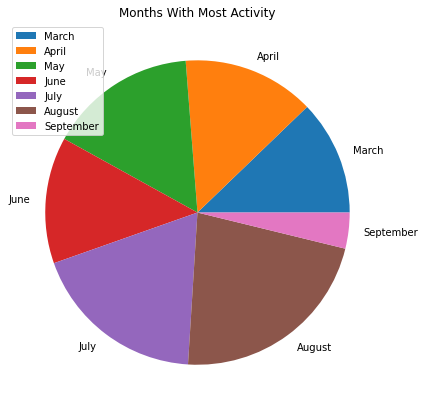

In [30]:
# Separating the dates across the 7 months.
count = [0] * 7
months = ['March', 'April', 'May', 'June', 'July', 'August', 'September']

for row, col in data.iterrows():
  # Getting the month in the date value
  curr = data.at[row, 'date'][6]

  # Converting the string to an int
  curr = int(curr)

  if curr == 3:
    count[0] += 1
  elif curr == 4:
    count[1] += 1
  elif curr == 5:
    count[2] += 1  
  elif curr == 6:
    count[3] += 1
  elif curr == 7:
    count[4] += 1
  elif curr == 8:
    count[5] += 1
  else:
    count[6] += 1

# Pie plot!
plt.figure(figsize =(10, 7)) 
plt.pie(count, labels = months)
plt.legend(months)
plt.title('Months With Most Activity')
plt.show()


Interesting! It looks like we have a uniform spread of activity across the months with data collected. September looks like it's lagging behind but there was only data collected for 8 days in the month. Attackers are consistent with their attacks throughout the year!

---


Next up we'll show how the number of attacks at each honeypot looked among the rest by using a bar graph.


In [9]:
# Separating the 9 honeypots
count = [0] * 9
pots = ['EU', 'Oregon', 'SA', 'Singapore', 'Sydney', 'Tokyo', 'US East', 'Groucho-norcal', 'Zeppo-norcal']

for row, col in data.iterrows():
  # Getting the host name
  curr = data.at[row, 'host']

  if curr == 'eu':
    count[0] += 1
  elif curr == 'oregon':
    count[1] += 1
  elif curr == 'sa':
    count[2] += 1  
  elif curr == 'singapore':
    count[3] += 1
  elif curr == 'sydney':
    count[4] += 1
  elif curr == 'tokyo':
    count[5] += 1
  elif curr == 'us-east':
    count[6] += 1
  elif curr == 'groucho-norcal':
    count[7] += 1
  elif curr == 'zeppo-norcal':
    count[8] += 1


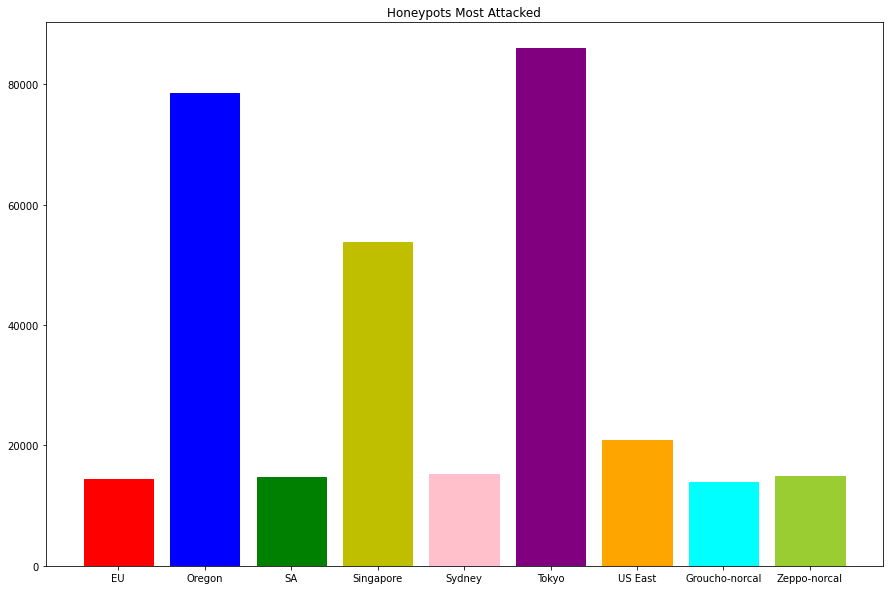

In [10]:
# Bar graph!
plt.figure(figsize =(15, 10)) 
bar = plt.bar(pots, count)

# Setting different colors for each honeypot, then plotting.
bar[0].set_color('r')
bar[1].set_color('b')
bar[2].set_color('g')
bar[3].set_color('y')
bar[4].set_color('pink')
bar[5].set_color('purple')
bar[6].set_color('orange')
bar[7].set_color('cyan')
bar[8].set_color('yellowgreen')

plt.title('Honeypots Most Attacked')
plt.show()

This is fascinating! The Oregon and Tokyo honeypots are targeted almost 4 times as much as: EU, SA, Sydney, US East, Groucho-norcal, and Zeppo-norcal. Singapore is the third most targeted honeypot at roughly 3 times as the servers preceding it (in targets). 

---
We've now identified malicious actors' activity across months and favorite honeypots to target, but now we have to see where these attacks are coming from.

Here, we're going to use the folium.plugins package to create a heatmap of the attack sources. To do this, we'll be utilizing the latitude and longitude values available to us in the dataset.


In [11]:
# Creating the map, centered at the (0, 0) coordinates and zoomed out at the global scale
global_map = folium.Map(location = [0, 0], zoom_start= 2)

# Defining the heat map
heat = []
for row, col in data.iterrows():
  heat.append((data.at[row, 'latitude'], data.at[row, 'longitude']))

HeatMap(heat).add_to(global_map)

# Showing the map
global_map

At the base zoom level, there's clearly a lot going on here. However, if you were to zoom in and browse through the different contents, you'll notice that Asia, Europe, Brazil, and the United States source most of the malicious actors. Areas like Australia, pacific Islands, Africa, and much of Central and South America show lesser amounts of activity. This can be used in network setup to emphasize filtering out unwanted (for example: RDP) activity from these areas.

# Model Creation and Analysis

Although plotting and graphing can be enjoyable and a pleasant use of time, data science exists to identify patterns and suggest solutions. It's now time for us to do just that.

In this part of the tutorial, we will go through 3 classification algorithms to test their prediction accuracy against our dataset. Meaning, we will specify a training and testing set across these 3 algorithms to find the most accurate predictor for our dataset. 

To be the most accurate predictor, we have to define what we're predicting. In this tutorial, we've focused on attacks at AWS honeypot, so we'll continue this focus here. In our models, we are going to try and predict which honeypot host is the target of an attack, based on our predictors: date-time, protocol, source IP, source country/ locale, packet source, source/ destination port, latitude, and longitude.

Some algorithms needed their hyperparameters tuned in order to fit the data best (to avoid under and over fitting data), and those which do (Decision Trees and KNN) have descriptions and code showing how that is done.

Directly below, you will find a description for each algorithm and a link to learn more about it. A little further down, we'll implement these algorithms on our data!


**Which models will we be using?**


1.   [Decision Trees](https://scikit-learn.org/stable/modules/tree.html): Takes input parameters and the data is continuously split according to these parameters - or in our case, the columns - and allow us to analyze all possible outcomes of a decision.

---


2.   [Random Forest Trees](https://scikit-learn.org/stable/modules/generated/sklearn.ensemble.RandomForestClassifier.html): This consists of many decisions trees, but builds them randomly and uses bagging functions to do so. It allows for higher accuracy through cross-validation of parameters, which is reinforced by the randomness and removal of possible bias in ordering of terms that occurs in decision trees.

---


3.   [K Nearest Neighbors](https://scikit-learn.org/stable/modules/neighbors.html): works by calculating the distances/ relationships between a query and training data points, selecting the num examples (K) closest to that query and returns the most frequent label.

**Preparing the data for modeling**

In order for some of the functions linked above and shown below to work, non-numerical values must be [label-encoded](https://towardsdatascience.com/categorical-encoding-using-label-encoding-and-one-hot-encoder-911ef77fb5bd). Effectively, this will assign a numerical value to the non-numerical value, which the functions will accept.

Below, an example of label encoding from the Sklearn library is shown. The 7 attributes: date, time, host, proto, srcstr, country, and locale will all be labelled. Also, we will create a temp data frame that shows the previous values up against their encoded ones, as to give the reader reference on what the function has done, and what the values now look like.


In [12]:
# Create an instance of labelencoder
lab_enc = LabelEncoder()

# Assigning numerical values for any non-numerical type in the dataset, and storing it in another column.
data['date_enc'] = lab_enc.fit_transform(data['date'])
data['time_enc'] = lab_enc.fit_transform(data['time'])
data['host_enc'] = lab_enc.fit_transform(data['host'])
data['proto_enc'] = lab_enc.fit_transform(data['proto'])
data['srcstr_enc'] = lab_enc.fit_transform(data['srcstr'])
data['country_enc'] = lab_enc.fit_transform(data['country'])
data['locale_enc'] = lab_enc.fit_transform(data['locale'])

# Put the encoded columns next to their respective sources.
# Please note, temp only exists for visual purposes, and for following which encoded value is associated with the respective column's value.
temp = data.drop(columns =['src', 'spt', 'dpt', 'latitude', 'longitude']).copy()
temp = temp[['date_enc', 'time_enc', 'host', 'host_enc', 'proto', 'proto_enc', 'srcstr', 'srcstr_enc', 'country', 'country_enc', 'locale', 'locale_enc']]

# Output the side-by-side dataframe
temp

,date_enc,time_enc,host,host_enc,proto,proto_enc,srcstr,srcstr_enc,country,country_enc,locale,locale_enc
0,0,75437,oregon,2,TCP,0,61.131.218.218,37392,China,27,Jiangxi Sheng,379
1,0,75670,oregon,2,TCP,0,175.180.184.106,17697,Taiwan,123,Taipei,995
2,0,75669,us-east,7,UDP,1,50.45.128.28,34816,United States,133,Oregon,662
3,0,75698,tokyo,6,TCP,0,198.20.69.98,23377,United States,133,Illinois,357
4,0,75750,oregon,2,TCP,0,222.89.164.247,30809,China,27,Henan Sheng,336
...,...,...,...,...,...,...,...,...,...,...,...,...
312710,189,20273,oregon,2,TCP,0,114.158.78.173,4048,Japan,63,Tokyo-to,1036
312711,189,20034,eu,0,TCP,0,60.173.14.88,36878,China,27,Anhui Sheng,25
312712,189,20314,oregon,2,TCP,0,192.200.102.171,22061,United States,133,California,111
312713,189,20318,tokyo,6,TCP,0,1.173.108.132,193,Taiwan,123,Taipei,995


**Now that the encoding is done...**

We will print the main dataset (with the encoded values) to show what they look like next to the values that did not be encoded. To do so, we will have to drop the columns that we previously encoded, so that we can continue to use this dataframe in our analysis. 

For followability purposes, we will also reorder the columns using Pandas dataframe manipulation so that the user will continue to read the attributes in the same order they have been so far.

In [13]:
# Drop the columns that needed to be encoded, but keeping their encoded counterparts
data.drop(columns = ['date', 'time', 'host', 'proto', 'srcstr', 'country', 'locale'], inplace= True)

# We will reorder the columns to maintain their previous order
data = data[['date_enc', 'time_enc', 'host_enc', 'src', 'proto_enc', 'spt', 'dpt', 'srcstr_enc', 'country_enc', 'locale_enc', 'latitude', 'longitude']]

# The x value is predictors, y value is predicted per the objective defined earlier.
x = data.drop('host_enc', axis = 1)
y = data['host_enc']

# Splitting Data into training/testing sets
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.5)

# Printing this updated dataset
data

,date_enc,time_enc,host_enc,src,proto_enc,spt,dpt,srcstr_enc,country_enc,locale_enc,latitude,longitude
0,0,75437,2,1032051418,0,6000.0,1433.0,37392,27,379,28.5500,115.9333
1,0,75670,2,2947856490,0,2489.0,1080.0,17697,123,995,25.0392,121.5250
2,0,75669,7,841842716,1,43235.0,1900.0,34816,133,662,45.5848,-122.9117
3,0,75698,6,3323217250,0,32628.0,2323.0,23377,133,357,41.8825,-87.6441
4,0,75750,2,3730416887,0,6000.0,1433.0,30809,27,336,34.6836,113.5325
...,...,...,...,...,...,...,...,...,...,...,...,...
312710,189,20273,2,1922977453,0,62175.0,445.0,4048,63,1036,35.6850,139.7514
312711,189,20034,0,1017974360,0,6000.0,8090.0,36878,27,25,31.8639,117.2808
312712,189,20314,2,3234358955,0,6000.0,1433.0,22061,133,111,34.0530,-118.2642
312713,189,20318,6,28142724,0,3555.0,445.0,193,123,995,25.0392,121.5250


**Model 1: Decision Trees**

In the code below, we will search for the most optimal max depth based on the peak of the plots graphed below. The function is written to plot the highest accuracy score associated at inputted max depth values. For more information on the purpose of this function, check out its [source](https://towardsdatascience.com/understanding-decision-trees-for-classification-python-9663d683c952)!

We find this max depth to avoid under/over fitting the data.

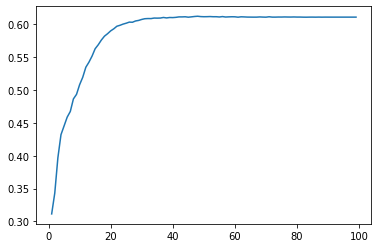

In [14]:
# Function for finding best max depth Part 1
max_depth_range = list(range(1, 100)) # List of values to try for max_depth.
accuracy = []

for depth in max_depth_range:
  clf = DecisionTreeClassifier(max_depth = depth, random_state= 0)
  clf.fit(x_train, y_train)
  score = clf.score(x_test, y_test)
  accuracy.append(score)

# Plotting to find the peak value, which indicates best max_depth
plt.plot(max_depth_range, accuracy)
plt.show()

Looking at the first plot above, we can see the peak happens somewhere between the values [25, 45]. So let's plot it again, but now with a smaller, more focused range.

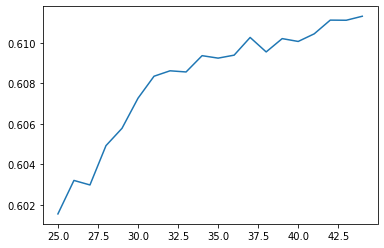

In [15]:
# Function for finding best max depth Part 2
max_depth_range = list(range(25, 45)) # List of values to try for max_depth.
accuracy = []

for depth in max_depth_range:
  clf = DecisionTreeClassifier(max_depth = depth, random_state= 0)
  clf.fit(x_train, y_train)
  score = clf.score(x_test, y_test)
  accuracy.append(score)

# Plotting to find the peak value, which indicates best max_depth
plt.plot(max_depth_range, accuracy)
plt.show()

**Optimal max depth found!**

We can now see the peak lies around x = 41, meaning it is our most optimal max depth. With this found, we have to define our tree with said max depth, fit it, and predict the accuracy of this model on our dataset.

In [16]:
# Defining and fitting our tree.
tree = DecisionTreeClassifier(max_depth = 41, random_state= 0)
tree_fit = tree.fit(x_train, y_train)

# Printing the accuracy score
print("Decision Tree Accuracy: ", tree.score(x_test, y_test))

Decision Tree Accuracy:  0.6104516558155003


This model has produced 61.1% accuracy when predicting which host honeypot will be attacked.


---
**Model 2: Random Forest Tree**

Then we will define and fit our random forest. For this tutorial, we will choose n_estimators to be 500. This value represents the number of trees in the forest, given the large dataset, we'll be arbitrarily choosing 500 as a value greater than the default: 100.

Finally, we will print its prediction accuracy score.

In [17]:
# Creating the Random Forest model
rft = RandomForestClassifier(n_estimators= 500, random_state= 0)
rft_fit = rft.fit(x_train, y_train)

# Printing the accuracy score
print("Random Forest Tree Accuracy: ", rft.score(x_test, y_test))

Random Forest Tree Accuracy:  0.637946251550928


This model produced 63.8% accuracy when predicting which host honeypot will be attacked. 


---
**Model 3: K Nearest Neighbors**

Similar to the Decision Trees above, we will plot to find the most optimal K parameter to predict our dataset. For more information on this particular algorithm, check out the [source](https://www.geeksforgeeks.org/k-nearest-neighbor-algorithm-in-python/)!

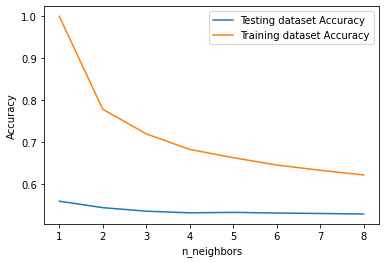

In [18]:
# Creating the range of test K-values
neighbors = np.arange(1, 9) 
train_accuracy = np.empty(len(neighbors)) 
test_accuracy = np.empty(len(neighbors)) 
  
# Loop over K values 
for i, k in enumerate(neighbors): 
    knn = KNeighborsClassifier(n_neighbors=k) 
    knn.fit(x_train, y_train) 
      
    # Compute training and test data accuracy 
    train_accuracy[i] = knn.score(x_train, y_train) 
    test_accuracy[i] = knn.score(x_test, y_test) 
  
# Generate plot 
plt.plot(neighbors, test_accuracy, label = 'Testing dataset Accuracy') 
plt.plot(neighbors, train_accuracy, label = 'Training dataset Accuracy') 
  
plt.legend() 
plt.xlabel('n_neighbors') 
plt.ylabel('Accuracy') 
plt.show() 

**Best K-value found!**

Looking at the plot above, the best K-value for our testing dataset is K = 1. With this found, we have to define our model with this value, fit it, and predict the accuracy of this model on our dataset.

In [19]:
# Creating the K-Neighbors model
knn = KNeighborsClassifier(n_neighbors= 1)
knn_fit = knn.fit(x_train, y_train)

# Printing the accuracy score
print("K Nearest Neighbors Accuracy: ", knn.score(x_test, y_test))

K Nearest Neighbors Accuracy:  0.5586538584530373


This model produced 55.9% accuracy when predicting which host honeypot will be attacked. 



---

**Now that we've finished all 3 models:**

Let's compare the values we've so found far! We'll visualize our results for each model against each other, and also the accuracy of each one. We're going to create a bar graph to help us do this:

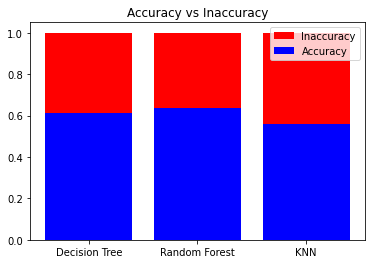

In [20]:
# Adding the Decision Tree Score
plt.bar(['Decision Tree'], 1, color = 'r')
plt.bar(['Decision Tree'], tree.score(x_test, y_test), color = 'b')

# Adding the Random Forest Tree Score
plt.bar(['Random Forest'], 1, color = 'r')
plt.bar(['Random Forest'], rft.score(x_test, y_test), color = 'b')

# Adding the KNN Score
plt.bar(['KNN'], 1, color = 'r')
plt.bar(['KNN'], knn.score(x_test, y_test), color = 'b')

# Creating a title, legend, and plotting the graph
plt.title("Accuracy vs Inaccuracy")
plt.legend(['Inaccuracy', 'Accuracy'], loc = 1)
plt.show()

# Results!

As you can see from the bar graph above, all 3 models predicted our test data pretty much the same. No one model stood out as the clear "best" for predicting which AWS honeypot will experience malicious activity.

The average result of 60.3% accuracy is by no means great, but it does suggest that the data may be unpredictable; given the context and uncertainty of malicious actors worldwide, this theory is very plausible.

These results would be much better and more satisfying to conclude on if hackers were uniform in background, attack type, and time of day but that's not the case, and nor will it ever be.

Since the bad guys won't back down, neither should the good guys! To read more about protecting yourself online, check out these resources: 


*   https://staysafeonline.org/blog/5-easy-online-safety-tips/
*   https://us.norton.com/internetsecurity-how-to-5-ways-you-can-help-yourself-stay-secure-online.html
*   https://www.consumer.ftc.gov/articles/0272-how-keep-your-personal-information-secure



I hope this tutorial was informative and interesting, thank you for reading!